<a href="https://colab.research.google.com/github/ArhanWR/Pengolahan-Citra-dan-Visi-Komputer/blob/main/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Praktikum

In [46]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Konvolusi tanpa Library**

Membuat fungsi konvolusi

Fungsi konvolusi yang dibuat memiliki parameter berupa:
1. citra masukan,
2. kernel berupa matriks untuk memfilter citra,
3. nilai stride / besarnya pergeseran untuk setiap konvolusi,
4. nilai pad yang akan ditambahkan pada citra

In [32]:
def convolution2d(image, kernel, stride, padding):
  img = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')
  img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

  #image sharpen
  kernel_sharpen = np.array([[0,-1,0],
                            [-1,5,-1],
                            [0,-1,0]])

  convolution2d(img_gray,kernel_sharpen,1,2)

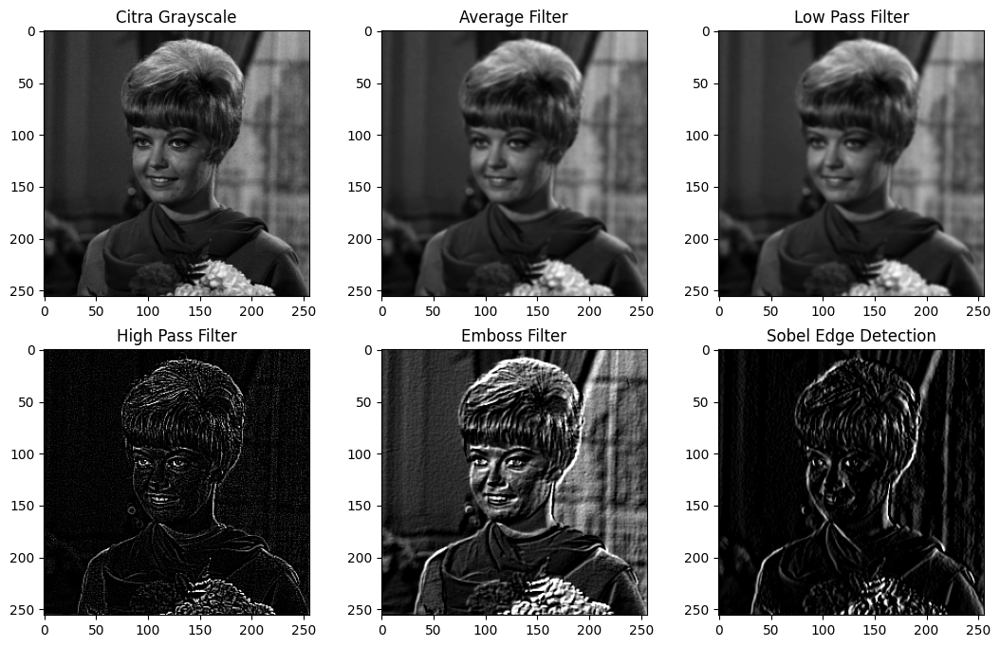

In [42]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')

# Ubah gambar menjadi citra grayscale
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Filter Average (Filter Rata-rata)
kernel_average = np.ones((3, 3), np.float32) / 9
result_average = cv.filter2D(gray_image, -1, kernel_average)

# Filter Low Pass
kernel_low_pass = np.array([[1, 4, 6, 4, 1],
                            [4, 16, 24, 16, 4],
                            [6, 24, 36, 24, 6],
                            [4, 16, 24, 16, 4],
                            [1, 4, 6, 4, 1]]) / 256
result_low_pass = cv.filter2D(gray_image, -1, kernel_low_pass)

# Filter High Pass
kernel_high_pass = np.array([[-1, -1, -1],
                             [-1,  8, -1],
                             [-1, -1, -1]])
result_high_pass = cv.filter2D(gray_image, -1, kernel_high_pass)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(gray_image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(gray_image, -1, kernel_sobel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(13, 8))

plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Citra Grayscale")
plt.axis('on')

plt.subplot(2, 3, 2)
plt.imshow(result_average, cmap='gray')
plt.title("Average Filter")
plt.axis('on')

plt.subplot(2, 3, 3)
plt.imshow(result_low_pass, cmap='gray')
plt.title("Low Pass Filter")
plt.axis('on')

plt.subplot(2, 3, 4)
plt.imshow(result_high_pass, cmap='gray')
plt.title("High Pass Filter")
plt.axis('on')

plt.subplot(2, 3, 5)
plt.imshow(result_emboss, cmap='gray')
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(2, 3, 6)
plt.imshow(result_sobel, cmap='gray')
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.show()

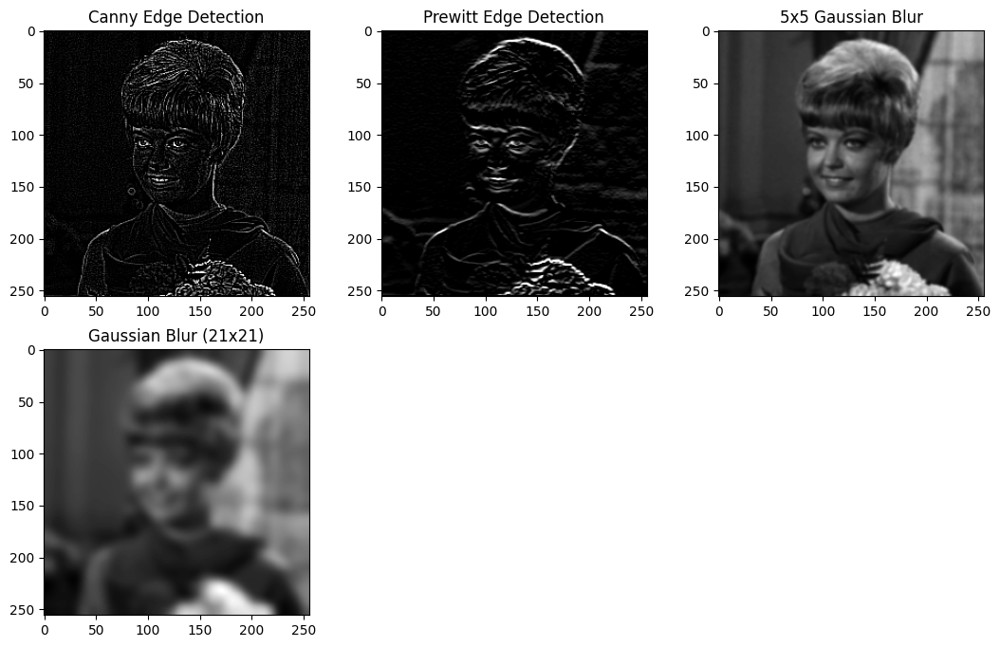

In [45]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/female.tiff')

# Ubah gambar menjadi citra grayscale
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(gray_image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(gray_image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(gray_image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(gray_image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(13, 8))

plt.subplot(2, 3, 1)
plt.imshow(result_canny, cmap='gray')
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(2, 3, 2)
plt.imshow(result_prewitt, cmap='gray')
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(2, 3, 3)
plt.imshow(result_gaussian_lima, cmap='gray')
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(2, 3, 4)
plt.imshow(result_gaussian, cmap='gray')
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

# **Tugas Praktikum**

Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui
implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan
operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


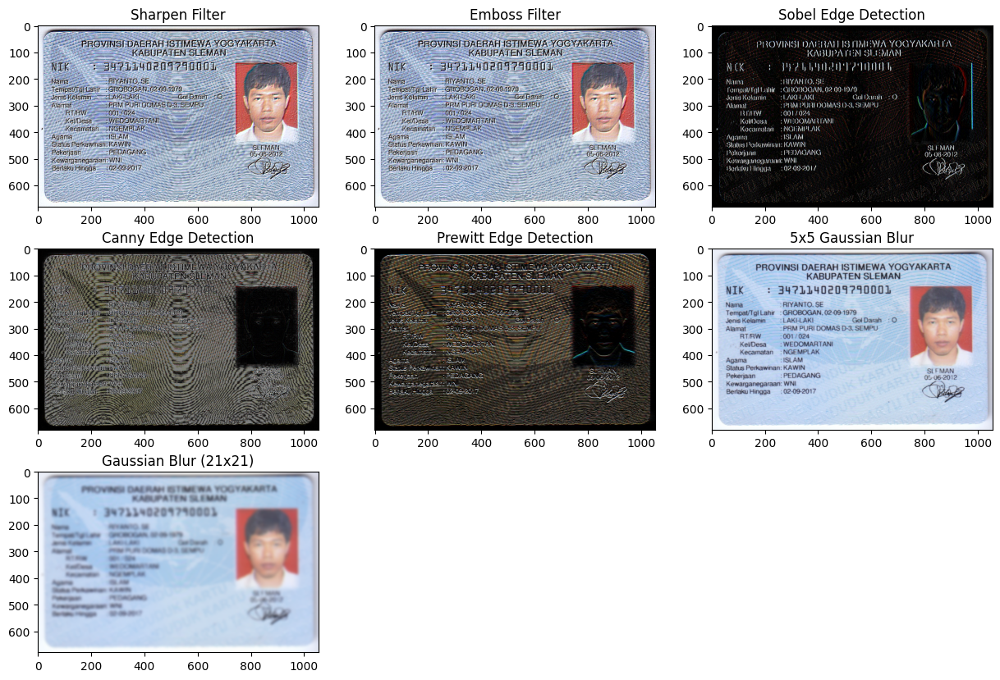

In [53]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

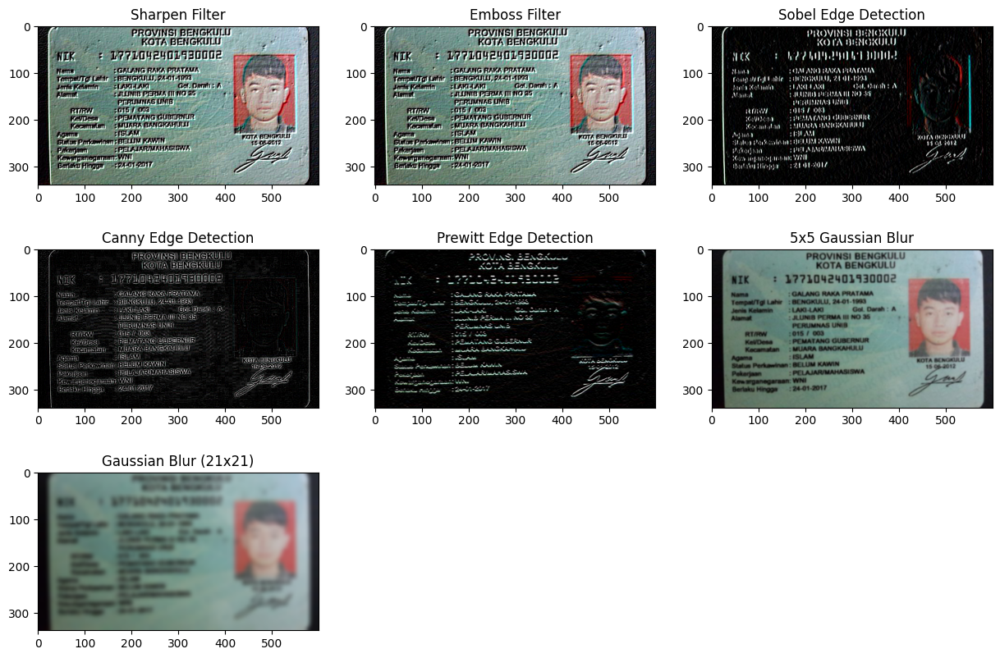

In [54]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp1.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

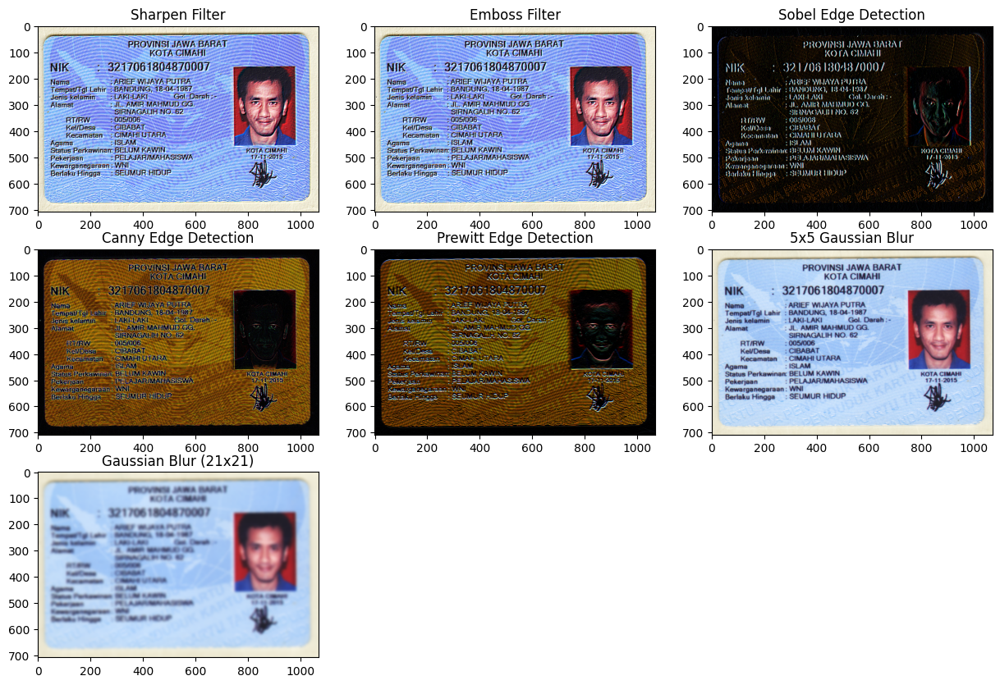

In [55]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp2.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

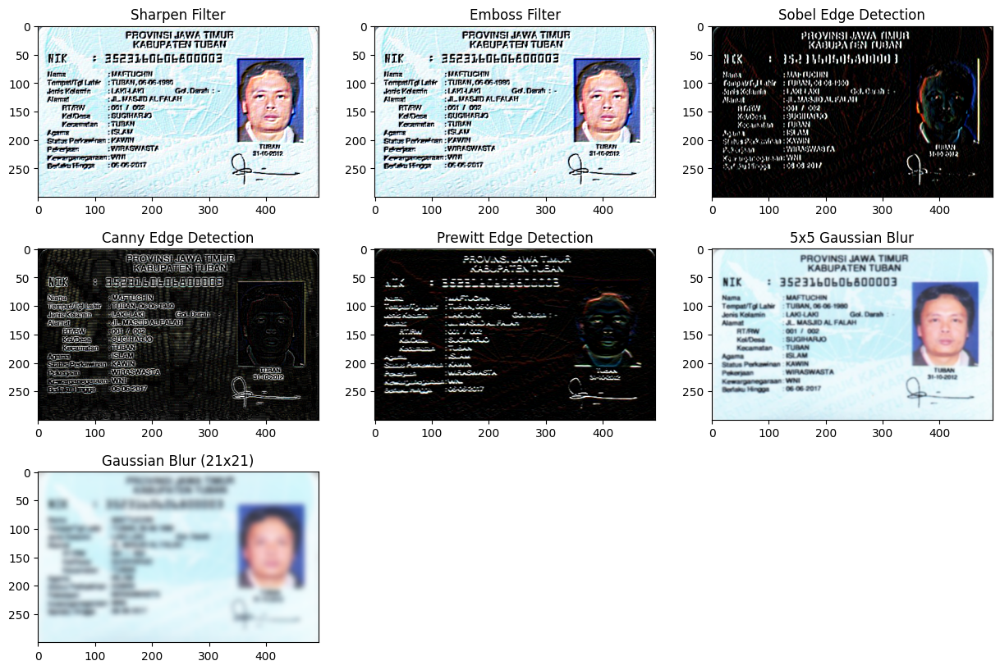

In [56]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp3.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

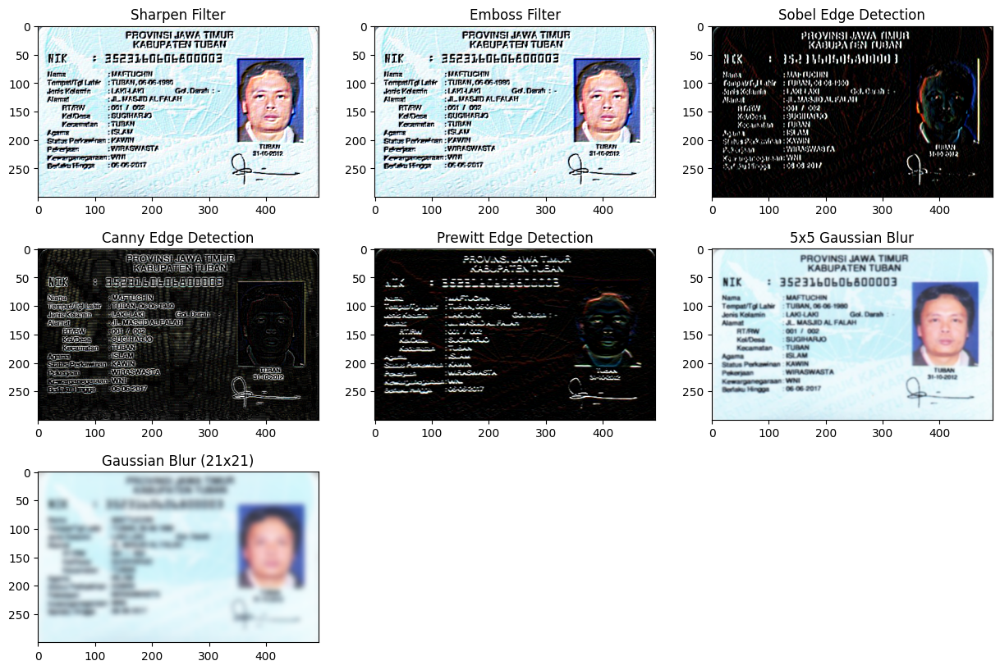

In [57]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp4.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

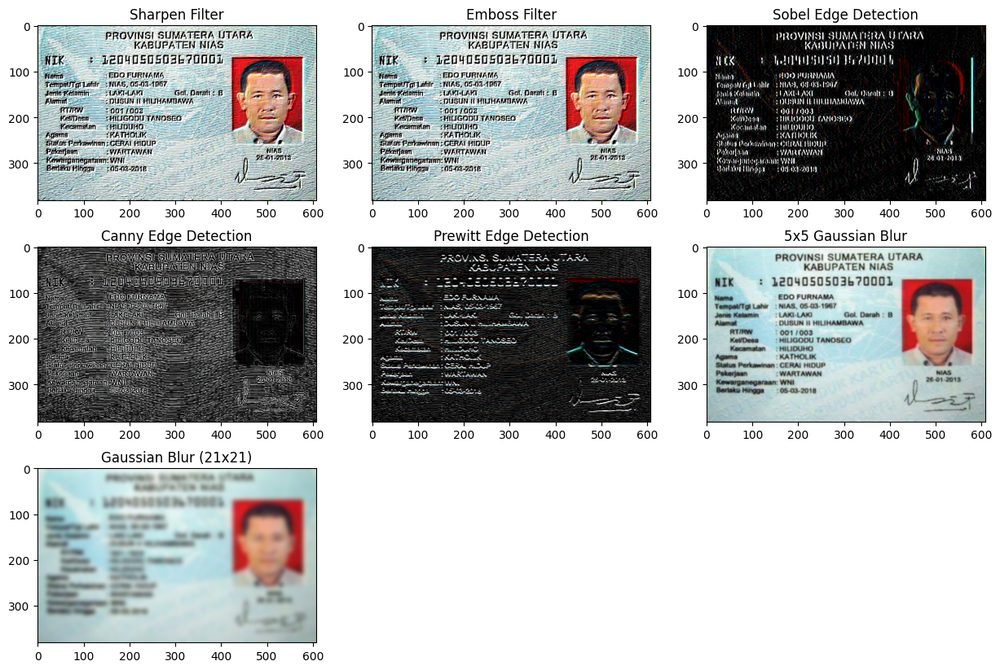

In [58]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp5.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

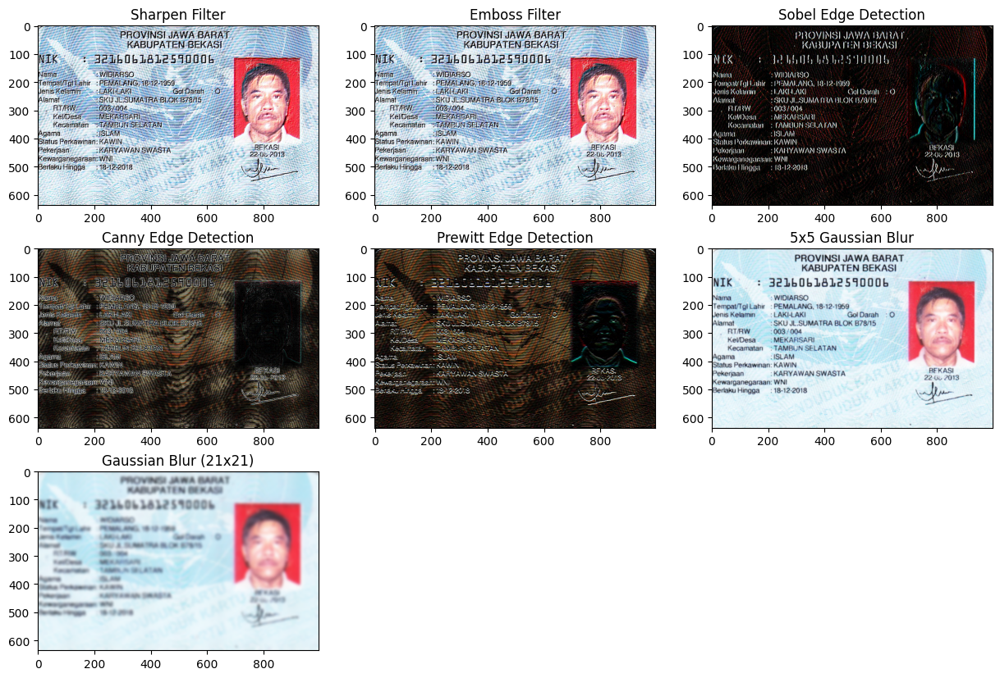

In [59]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/ktp6.png')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()

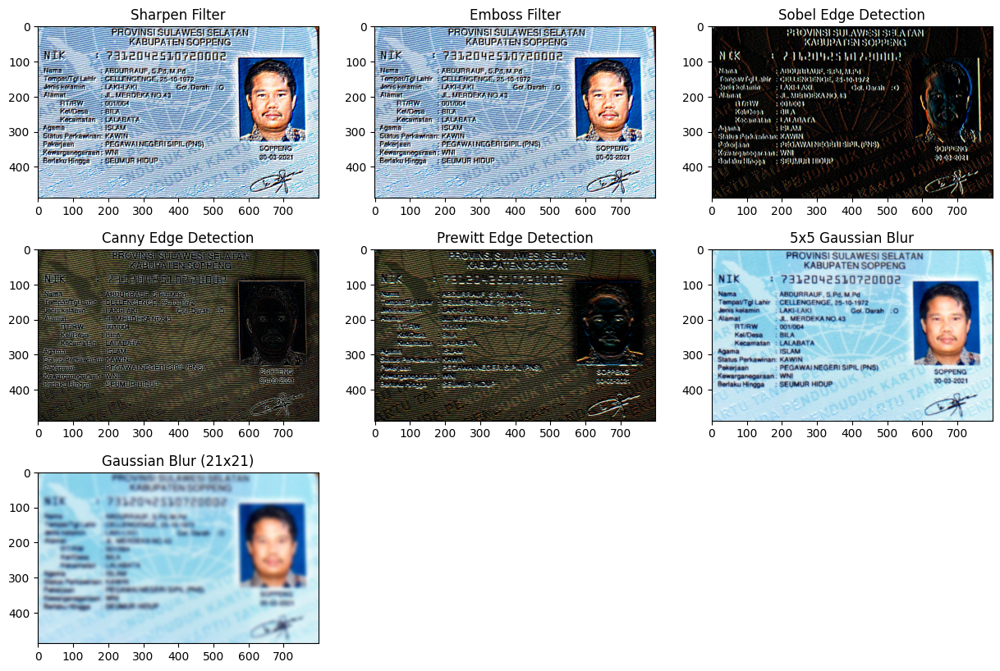

In [60]:
# Baca gambar sumber
image = cv.imread('/content/drive/MyDrive/PCVK/KTP_More/KTP7.jpeg')

#Filter sharpen
kernel_sharpen = np.array([[0,-1,0],
                          [-1,5,-1],
                          [0,-1,0]])
result_sharpen = cv.filter2D(image, -1, kernel_sharpen)

# Filter Emboss
kernel_emboss = np.array([[-2, -1, 0],
                          [-1,  1, 1],
                          [0,  1, 2]])
result_emboss = cv.filter2D(image, -1, kernel_emboss)

# Filter Deteksi Tepi Sobel
kernel_sobel = np.array([[-1, 0, 1],
                         [-2, 0, 2],
                         [-1, 0, 1]])
result_sobel = cv.filter2D(image, -1, kernel_sobel)

# Filter Deteksi Tepi Canny
kernel_canny = np.array([[-1, -1, -1],
                         [-1,  8, -1],
                         [-1, -1, -1]])
result_canny = cv.filter2D(image, -1, kernel_canny)

# Filter Deteksi Tepi Prewitt
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
result_prewitt = cv.filter2D(image, -1, kernel_prewitt)

# Filter Gaussian 5x5
kernel_gaussian_lima = np.array([[1, 4, 6, 4, 1],
                                 [4, 16, 24, 16, 4],
                                 [6, 24, 36, 24, 6],
                                 [4, 16, 24, 16, 4],
                                 [1, 4, 6, 4, 1]]) * 1/256
result_gaussian_lima = cv.filter2D(image, -1, kernel_gaussian_lima)

# Generate kernel Gaussian 21x21
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

# Filter Gaussian Blur
result_gaussian = cv.filter2D(image, -1, gauss_kernel)

# Menampilkan gambar dalam subplot
plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Sharpen Filter")
plt.axis('on')

plt.subplot(3, 3, 2)
plt.imshow(cv.cvtColor(result_emboss, cv.COLOR_BGR2RGB))
plt.title("Emboss Filter")
plt.axis('on')

plt.subplot(3, 3, 3)
plt.imshow(cv.cvtColor(result_sobel, cv.COLOR_BGR2RGB))
plt.title("Sobel Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 4)
plt.imshow(cv.cvtColor(result_canny, cv.COLOR_BGR2RGB))
plt.title("Canny Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 5)
plt.imshow(cv.cvtColor(result_prewitt, cv.COLOR_BGR2RGB))
plt.title("Prewitt Edge Detection")
plt.axis('on')

plt.subplot(3, 3, 6)
plt.imshow(cv.cvtColor(result_gaussian_lima, cv.COLOR_BGR2RGB))
plt.title("5x5 Gaussian Blur")
plt.axis('on')

plt.subplot(3, 3, 7)
plt.imshow(cv.cvtColor(result_gaussian, cv.COLOR_BGR2RGB))
plt.title("Gaussian Blur (21x21)")
plt.axis('on')

plt.show()